In [62]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/trip-advisor-hotel-reviews/tripadvisor_hotel_reviews.csv


importing the nlp dataset

In [63]:
data_path='/kaggle/input/trip-advisor-hotel-reviews/tripadvisor_hotel_reviews.csv'
data=pd.read_csv(data_path)

In [64]:
data.head(8)

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not 4* experience hotel monaco seat...,3
3,"unique, great stay, wonderful time hotel monac...",5
4,"great stay great stay, went seahawk game aweso...",5
5,love monaco staff husband stayed hotel crazy w...,5
6,"cozy stay rainy city, husband spent 7 nights m...",5
7,"excellent staff, housekeeping quality hotel ch...",4


viewing the rows and columns

In [65]:
data.shape

(20491, 2)

shuffling the dataset for equal distribution

In [66]:
data=data.sample(frac=1)

selecting the first 10000 samples only for easier computation

In [67]:
data=data.iloc[0:10000]

In [68]:
data.shape

(10000, 2)

importing data viz libraries

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


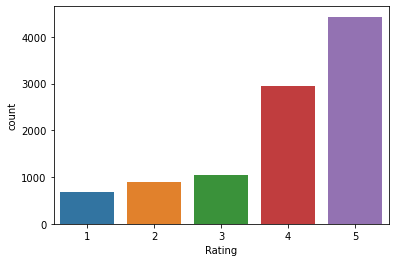

In [70]:
sns.countplot(data.Rating)
plt.show()

using regex expressions to remove all the non alphabet character from the dataset

In [71]:
import re
text_data=data.Review.apply(lambda x:re.sub("[^a-zA-Z]"," ",x))

In [72]:
text_data.head()

4296     stayed room    told flagship suite hotel june ...
6922     ok not great told excellence punta cana best e...
7816     great value weekend rate  review andywa basica...
2211     wonderful stay silver cloud just returned driv...
13743    fabulous value base decisions large degree rev...
Name: Review, dtype: object

observing he data before and after the regex operations

In [73]:
print("Before: {}".format(data['Review'][3]))
print("After: {}".format(text_data[3]))

Before: unique, great stay, wonderful time hotel monaco, location excellent short stroll main downtown shopping area, pet friendly room showed no signs animal hair smells, monaco suite sleeping area big striped curtains pulled closed nice touch felt cosy, goldfish named brandi enjoyed, did n't partake free wine coffee/tea service lobby thought great feature, great staff friendly, free wireless internet hotel worked suite 2 laptops, decor lovely eclectic mix pattens color palatte, animal print bathrobes feel like rock stars, nice did n't look like sterile chain hotel hotel personality excellent stay,  
After: unique  great stay  wonderful time hotel monaco  location excellent short stroll main downtown shopping area  pet friendly room showed no signs animal hair smells  monaco suite sleeping area big striped curtains pulled closed nice touch felt cosy  goldfish named brandi enjoyed  did n t partake free wine coffee tea service lobby thought great feature  great staff friendly  free wire

**Tokenization and lower case conversion**

Tokenization is the process of splitting the entire textual data into small pieces of text called tokens wherein each of the first columns of the textual data will be coveted to a list of tokens split with a comma (,) operator.

In [74]:
import nltk
from nltk.tokenize import RegexpTokenizer

first lets create a Regexptokenizer object to seperate the words

In [75]:
tokenizer=RegexpTokenizer('\w+')

Here in the tokenization instance being created (\w+) instance is being used to match one or more occurring words which may either be a-z or A-Z. So now using this instance let us see how to perform tokenization.

**Step - 3: Performing Tokenization**

In [76]:
tokens=text_data.apply(lambda x:tokenizer.tokenize(x))

A lambda function is used to perform tokenization on the entire textual data by calling the inbuilt function of RegexpTokenizer. Let us visualize the tokenized data using a print statement.

viewing the list of tokens in a pandas dataset

In [77]:
print(tokens[:5])

4296     [stayed, room, told, flagship, suite, hotel, j...
6922     [ok, not, great, told, excellence, punta, cana...
7816     [great, value, weekend, rate, review, andywa, ...
2211     [wonderful, stay, silver, cloud, just, returne...
13743    [fabulous, value, base, decisions, large, degr...
Name: Review, dtype: object


In [78]:
tokens.tail()

15876    [excellent, stay, stayed, ayodya, palace, reso...
20437    [great, good, rate, staying, intercontinental,...
16063    [good, hotel, money, booked, ratestogo, com, a...
4249     [tiny, rooms, excellent, place, stay, monk, ro...
3340     [surely, stay, stayed, executive, level, room,...
Name: Review, dtype: object

So this is how the entire text data is split into small pieces using the process of Tokenization. So now we have to convert all the tokens of the text data into lower case.

**Step-4: Lower case conversion of the tokenized data**

In [79]:
lower=[list(map(lambda x:x.lower(),l)) for l in tokens]

In [80]:
lower_csv=pd.DataFrame(lower)

checking before and after completely lowercasing the dataset

In [81]:
print('Original text document: {}'.format(text_data[1]))
print()
print('Lower case converted document: {}'.format(lower[1]))

Original text document: ok nothing special charge diamond member hilton decided chain shot   th anniversary seattle  start booked suite paid extra website description not  suite bedroom bathroom standard hotel room  took printed reservation desk showed said things like tv couch ect desk clerk told oh mixed suites description kimpton website sorry free breakfast  got kidding  embassy suits sitting room bathroom bedroom unlike kimpton calls suite    day stay offer correct false advertising  send kimpton preferred guest website email asking failure provide suite advertised website reservation description furnished hard copy reservation printout website desk manager duty did not reply solution  send email trip guest survey did not follow email mail  guess tell concerned guest the staff ranged indifferent not helpful  asked desk good breakfast spots neighborhood hood told no hotels  gee best breakfast spots seattle     block away convenient hotel does not know exist  arrived late night    p

importing the stopwords from nltk.corpus library to select and differentiate them from the important tokens present

In [82]:
from nltk.corpus import stopwords

**Step-3: Creating an instance for common stopwords in the English language**

In [83]:
stopwords=nltk.corpus.stopwords.words('english')

Now let us visualize the top 30 stopwords present in the nltk library through slicing operations.

In [84]:
stopwords[0:30]

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself']

removing the stopwords from the lower list to help with easier selection/computation

In [85]:
stop=[]
for line in lower:
 words=[]
 for word in line:
   if word not in stopwords:
     words.append(word)
 stop.append(words)

In [86]:
print(stop)

[['stayed', 'room', 'told', 'flagship', 'suite', 'hotel', 'june', 'based', 'experiences', 'star', 'hotels', 'hyatts', 'marriotts', 'disappointed', 'property', 'room', 'small', 'buttresses', 'obstructed', 'headroom', 'half', 'room', 'bathroom', 'cleaned', 'properly', 'arrival', 'staff', 'assume', 'manager', 'duty', 'check', 'departure', 'rude', 'wanted', 'argue', 'bathroom', 'day', 'check', 'conversations', 'day', 'continental', 'breakfast', 'listed', 'euros', 'hotel', 'website', 'charged', 'euros', 'dining', 'room', 'offerings', 'marginal', 'quality', 'quantity', 'milk', 'sour', 'service', 'better', 'way', 'eat', 'better', 'breakfast', 'euros', 'corner', 'place', 'des', 'invalides', 'daughter', 'discovered', 'unpacked', 'luggage', 'home', 'items', 'purchased', 'makeup', 'missing', 'hotel', 'internet', 'connection', 'told', 'thursday', 'repaired', 'friday', 'n', 'happen', 'really', 'needed', 'convenience', 'business', 'reason', 'booked', 'hotel', 'overall', 'satisfactory', 'small', 'hot

Here an empty list named stop is created to append the words that are not present in the standard list of the nltk module where the stopwords will be removed from the lower case converted data.

**Step-6: Analyzing the data before and after stopword removal**

Here is a simple print statement to analyze the textual data before and after removing the stopwords

In [87]:
print('Text column with stopword',lower[-1])
print()
print('Text column after removing stopword',stop[-1])

Text column with stopword ['surely', 'stay', 'stayed', 'executive', 'level', 'room', 'newer', 'tower', 'room', 'not', 'bad', 'nice', 'view', 'executive', 'level', 'lounge', 'good', 'seleciton', 'snacks', 'drinks', 'day', 'grounds', 'generally', 'pretty', 'include', 'tropical', 'garden', 'pond', 'swans', 'private', 'beach', 'pools', 'restaurants', 'shops', 'good', 'parts', 'unfortunately', 'negative', 'aspects', 'significantly', 'cut', 'enjoying', 'vacation', 'revolve', 'terrible', 'service', 'overcharging', 'reasons', 'advise', 'stay', 'elsewhere', 'we', 'requested', 'nonsmoking', 'room', 'beds', 'confirmed', 'twice', 'instead', 'received', 'room', 'smelled', 'stale', 'smoke', 'floor', 'no', 'non', 'smoking', 'signs', 'just', 'single', 'king', 'size', 'bed', 'hesitant', 'request', 'room', 'change', 'experience', 'punative', 'component', 'replacement', 'room', 'quite', 'worse', 'the', 'service', 'poor', 'valets', 'bellmen', 'n', 't', 'come', 'greet', 'drive', 'valet', 'service', 'takes'

So here in the output, we can see that the common stop words of the English language like ‘i’ and ‘here’ are removed.

**5. Stemming the textual data**

Stemming is the process of just removing the last characters of each of the lower case converted characters using some standard NLTK packages. Here let us see how to use the LanCasterStemmer to perform the stemming operation.

**Step-1: Importing the stemming package from NLTK**

Here the Lancaster Stemmer library is being imported into the working environment.

In [88]:
from nltk.stem import LancasterStemmer

**Step - 2: Performing the stemming operation**

Here an empty list named stem is created and the stem function of LanCasterStemmer is used to chop off the last occurring character and the stem word will be appended to the empty list being created.

In [89]:
stem=[]
for line in stop:
 words=[]
 for word in line:
   words.append(LancasterStemmer().stem(word))
 stem.append(words)

So here only the stemmed words are appended to the stem list being created.

**Step-3: Analyzing the data before and after stemming**

Here the data before and after performing stemming is analyzed through a simple print statement.

In [90]:
print('Text column without stemming : {}'.format(lower[555]))
print()
print('Text column after stemming : {}'.format(stem[1]))

Text column without stemming : ['hidden', 'gem', 'san', 'francisco', 'driver', 'airport', 'inn', 'heard', 'place', 'worried', 'great', 'little', 'place', 'niched', 'heart', 'san', 'francisco', 'got', 'bed', 'breakfast', 'feel', 'personalized', 'service', 'nice', 'complimentary', 'breakfast', 'size', 'smaller', 'hotel', 'desk', 'incredibly', 'amenable', 'willing', 'help', 'way', 'including', 'directions', 'restaurant', 'locations', 'major', 'negative', 'wireless', 'internet', 'really', 'spotty', 'business', 'traveler', 'n', 't', 'places', 'work', 'business', 'documents', 'heavily', 'reliant', 'laptop', 'overall', 'good', 'stay', 'great', 'price', 'city']

Text column after stemming : ['ok', 'gre', 'told', 'excel', 'punt', 'can', 'best', 'excel', 'lin', 'resort', 'vac', 'okay', 'problem', 'consid', 'money', 'spent', 'expect', 'bet', 'expery', 'mind', 'k', 'cheap', 'exampl', 'pro', 'con', 'let', 'decid', 'wor', 'money', 'pro', 'beach', 'wond', 'scen', 'palm', 'tre', 'plenty', 'umbrella', 

Here in the output, we can see that after applying stemming to the lower case converted test data that words like service are converted to serve and awesome to awesom

Lemmatization is one such process of text analytics where the context or the meaning of each of the lower case converted tokens is considered and the lemmatization process occurs. So let us see how to utilize the LanCasterStemmer of the NLTK module to implement lemmatization.

**Step-1: Importing the required library**

Here the required package of Lemmatization is imported into the working environment

In [91]:
from nltk.stem.wordnet import WordNetLemmatizer

**Step-2: Creating a lemmatization instance**

Here an instance for WordNetLemmatizer is created as shown below.

In [92]:
word_net_lem=WordNetLemmatizer()

**Step-3: Performing the lemmatization operation**

Here an empty list is created to append the lemmatized word by the lemmatization instance by using the inbuilt function of lemmatization named lemmatize as shown below. We will also use the verb lemma form to lemmatize the operation

In [93]:
lem=[]
for line in stop:
 words=[]
 for word in line:
   words.append(word_net_lem.lemmatize(word,pos='v'))
 lem.append(words)

viewing the lower,stem and lemma forms of sentences

In [94]:
print('Original data is : {}'.format(lower[3]))
print()
print('Stemmed data is : {}'.format(stem[3]))
print()
print('Lemmatized data is : {}'.format(lem[3]))

Original data is : ['wonderful', 'stay', 'silver', 'cloud', 'just', 'returned', 'driving', 'trip', 'british', 'columbia', 'way', 'enjoyed', 'night', 'stay', 'silver', 'cloud', 'lake', 'union', 'nice', 'reservations', 'return', 'trip', 'family', 'adults', 'teenagers', 'room', 'th', 'floor', 'beds', 'sofabed', 'gave', 'plenty', 'space', 'spread', 'great', 'view', 'lake', 'union', 'space', 'needle', 'impressed', 'cleanliness', 'room', 'hotel', 'general', 'plus', 'complimentary', 'washers', 'dryers', 'internet', 'access', 'breakfast', 'buffet', 'free', 'parking', 'friendly', 'staff', 'used', 'shuttle', 'pikes', 'market', 'asked', 'couple', 'recommendations', 'restaurants', 'family', 'dukes', 'chowder', 'house', 'meal', 'sat', 'outside', 'lake', 'union', 'best', 'clam', 'chowder', 'fish', 'chips', 'looking', 'forward', 'returning', 'silver', 'cloud', 'future', 'trips']

Stemmed data is : ['wond', 'stay', 'silv', 'cloud', 'return', 'driv', 'trip', 'brit', 'columb', 'way', 'enjoy', 'night', '

Here we can clearly see the difference between stemming and lemmatization and how lemmatization analyzes based on the context of the word.

Now let us use the lemmatized data and create a new column in our original dataset as shown below.

In [95]:
clean_text = []
for i in lem:
 clean_text.append(' '.join(i))
#Here an empty list is created to join each outcome of the lemmatization instance and later integrate with the data frame as shown below.
data['Cleaned_text']=clean_text
#Now let us visualize the top 5 entries of the data.
data.head(5)

,Review,Rating,Cleaned_text
4296,stayed room 62 told flagship suite hotel june ...,1,stay room tell flagship suite hotel june base ...
6922,ok not great told excellence punta cana best e...,2,ok great tell excellence punta cana best excel...
7816,"great value weekend rate, review andywa basica...",4,great value weekend rate review andywa basical...
2211,wonderful stay silver cloud just returned driv...,5,wonderful stay silver cloud return drive trip ...
13743,fabulous value base decisions large degree rev...,5,fabulous value base decisions large degree rev...


Here we can see that the lemmatization output for each entry of the original data is appended under the column named Cleaned_text

# 7. Visualizing the Cleaned textual data with WordClouds

WordClouds are basically used to visualize the text data where the frequently occurring word will appear bigger in the visual and the words occurring for a fewer number of times will appear relatively small in the visual.

**Step -1: Importing the required modules**

Here the module is made available in the working environment

In [96]:
from wordcloud import WordCloud

**Step -2: Generating word cloud for the textual data**

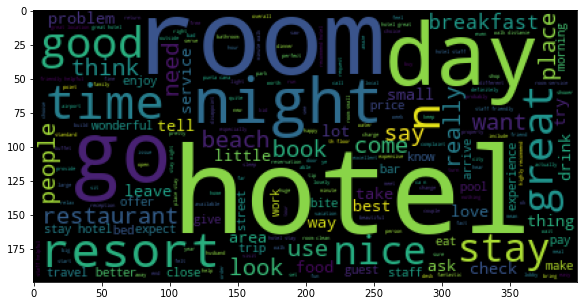

In [97]:
## Creating a word cloud instance
wc=WordCloud().generate(str(clean_text))
## Plotting the word cloud
plt.figure(figsize=(15,5))
plt.imshow(wc)
plt.show()

Here the Cleaned_text data column is used for WordCloud Visual and we can clearly see from the visual that words like the place, service, food, and good are used more frequently and words like best, service, and friendly are used very rarely.

Now let us try to obtain a wordcloud to visualize the most frequently occurring word in positive reviews where in the text document obtained after lemmatization is used to filter out the reviews.

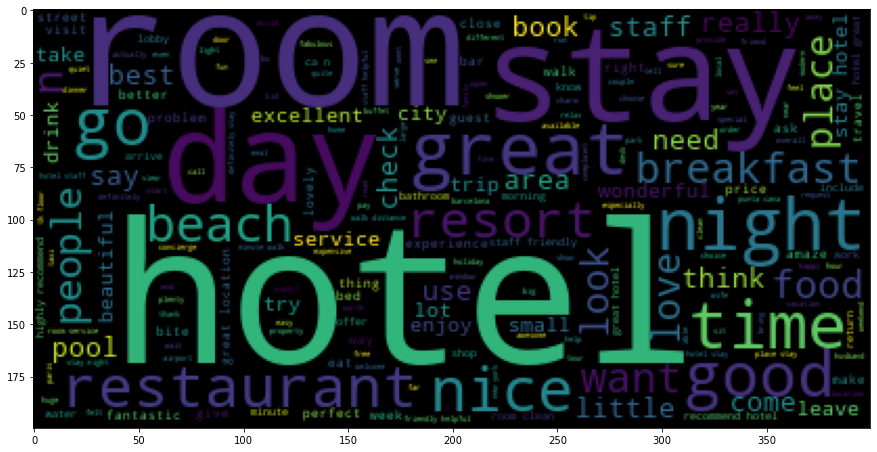

In [98]:
plt.figure(figsize = (15,15))
wc = WordCloud().generate(" ".join(data[data.Rating ==5].Cleaned_text))
plt.imshow(wc)
plt.show()

**8. CountVectorizer for feature extraction**

Countvectorizer is the process of converting textual data to numerical data, wherein it is a process similar to encoding in Machine Learning. Now let us see how to convert the textual data into numerical features using CountVectorizer.

**Step-1: Importing the required modules**

In [99]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split

**Step-2: Splitting the data into train and test**

Here the data is split into train and test by maintaining 20% of data for testing.

In [100]:
train_doc,test_doc=train_test_split(data['Cleaned_text'],test_size=0.2,random_state=42)

creating a CountVectorizer Object and fitting it

In [101]:
cv=CountVectorizer(min_df=3,max_df=7)
cv.fit(train_doc)

CountVectorizer(max_df=7, min_df=3)

**Step-4: Analyzing the numerical features through a dataframe**

Here the feature names are analyzed in the form of a data frame to analyze how the features are transformed to numerical features.

In [102]:
x  = cv.fit_transform(data.Cleaned_text.values).toarray()
x  = pd.DataFrame(x,columns=cv.get_feature_names())
x

/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,aa,ab,aback,abbey,abide,abound,abrasive,abrupt,absorb,absoultely,...,youself,ywca,zagat,zandbergen,zaza,zen,zipper,zoologischer,zoom,zurich
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In this output, we can see that for each of the tokens of the data the encoded output by the CountVectorizer.

**9. TF-IDF**

TF-IDF abbreviates for Term Frequency and Inverse Document frequency and is a better parameter to evaluate when compared to CountVectorizer as it not only focuses on the frequency of words in the text document but also on the importance of the context of the word and converts the textual data to numerical data and this parameter are interlinked inversely.

So let us see how to implement the same

**Step-1: Importing the required modules**

In [103]:
from sklearn.feature_extraction.text import TfidfVectorizer

**Step-2: Creating a tf-idf instance**

A TF-IDF instance is created by declaring the stopwords to English as shown below

In [104]:
tfidf_vec=TfidfVectorizer(stop_words="english")

**Step-3: Analyzing through a dataframe**

The feature names produced by the TF-IDF instance are manipulated to a data frame for easy interpretation as shown below.

In [105]:
tfidf_df = tfidf_vec.fit_transform(data.Cleaned_text.values)
tfidf_df= pd.DataFrame(tfidf_df.todense(),columns=tfidf_vec.get_feature_names())
tfidf_df

/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,aa,aaa,aaaa,aaaaa,aaaaaaaaa,aaaaaaaaaaaaaaa,aaahhh,aahh,aalders,aaron,...,zorbas,zucca,zuccia,zuid,zumo,zurich,zvago,zyrtec,zytec,zzzzzzzzz
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In this output, we can see for each of the token's that how frequently certain characters occur over the entire corpus.

**Analyzing the common words in the textual data with grams**

Grams are nothing but the number of words that occur in each of the tokens. There are majorly 4 types of grams present in text analytics. They are:-

1.Unigram 2.Bigram 3.Trigram 4.Ngram Analyzing a grams for common words

Unigrams are nothing but one word present per token and here the unigram is analyzed using a user-defined function and mentioning the gram factor as 1 in the function created below.

**Unigram text analysis**

In [106]:
def get_top_text_ngrams(corpus, n, g):
   vec = CountVectorizer(ngram_range=(g, g)).fit(corpus)
   bag_of_words = vec.transform(corpus)
   sum_words = bag_of_words.sum(axis=0)
   words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
   words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
   return words_freq[:n]

In [107]:
import plotly.express as px
common_uni = get_top_text_ngrams(data.Cleaned_text,20,1)
common_uni = dict(common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(common_uni.keys())
temp["Count"] = list(common_uni.values())
fig1 = px.bar(temp, x="Count", y="Common_words", title='Common Words in Unigram analysis', orientation='h',
            width=700, height=700,color='Common_words')
fig1.show()

In the unigram analysis, we can see that words like food occur more commonly and words like nice occur very less number of times.

**Bigram text analysis**

In a similar way, the common words in bigrams are observed by declaring the parameter as 2 in g and the same user-defined is used to obtain the plot using the plotly module.

In [108]:
common_big = get_top_text_ngrams(data.Cleaned_text,20,2)
common_big = dict(common_big)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(common_big.keys())
temp["Count"] = list(common_big.values())
fig2 = px.bar(temp, x="Count", y="Common_words", title='Common Words in Bigram analysis', orientation='h',
            width=700, height=700,color='Common_words')
fig2.show()

In the bigram analysis, we can see that words like go back occur more frequently and words like never ever are used less often.

Trigram text analysis

In a similar way, the common words in trigrams are observed by declaring the parameter as 3 in g and the same user-defined is used to obtain the plot using the plotly module.

In [109]:
common_tri = get_top_text_ngrams(data.Cleaned_text,20,3)
common_tri = dict(common_tri)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(common_tri.keys())
temp["Count"] = list(common_tri.values())
fig3 = px.bar(temp, x="Count", y="Common_words", title='Common Words in Trigram analysis', orientation='h',
            width=700, height=700,color='Common_words')
fig3.show()

In the trigram analysis, we can see that words like would not recommend occurring more frequently and words like would much rather are used less often.

So this is how different steps of text preproecssing and text analytics can be implemented in python.